### Download Dataset

In [ ]:
!gdown 1iBpVko2sehPeOPhQXWaujOpKFQmNvd_m
!unrar x -y -idq /content/RailSem19.rar RailSem19
!rm /content/RailSem19.rar

$$$$

In [ ]:
import sys, os, glob,  math
import numpy as np
import cv2, json
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from random import shuffle
import shutil

**Map bbox to color**

In [ ]:
rs19_label2bgr = {"buffer-stop": (70,70,70), # useless
                  "crossing": (128,64,128),
                  "guard-rail": (0,255,0), # useless
                  "train-car" :  (100,80,0),
                  "platform" : (232,35,244),
                  "rail": (255,255,0), # Segmentation

                  # Switches
                  "switch-indicator": (127,255,0),
                  "switch-left": (255,255,0),
                  "switch-right": (127,127,0),
                  "switch-unknown": (191,191,0),
                  "switch-static": (0,255,127),

                  # signalisation !!!!!!
                  "track-sign-front" : (0,220,220),
                  "track-signal-front" : (30,170,250),
                  "track-signal-back" : (0,85,125),

                  #rail occluders
                  "person-group" : (60,20,220),
                  "car" : (142,0,0),
                  "fence" : (153,153,190),
                  "person" : (60,20,220),
                  "pole" : (153,153,153), # segmentation
                  "rail-occluder" : (255,255,255), # useless
                  "truck" : (70,0,0)
                }

**Find masks and json files**

In [ ]:
def files_in_subdirs(start_dir, pattern = ["*.png","*.jpg","*.jpeg"]):
    files = []
    for p in pattern:
        for dir,_,_ in os.walk(start_dir):
            files.extend(glob.glob(os.path.join(dir,p)))
    return files

mask_files = os.listdir('RailSem19/rs19_masks')
json_files = os.listdir('RailSem19/rs19_jsons')
len(mask_files)

8500

**Map Segmentation to color**

In [ ]:
inp_json = json.load(open('RailSem19/rs19-config.json', 'r'))
print(f'Class ID  Class \t Color')
print("="*40)
for i,l in enumerate(inp_json['labels']):
  name = l.get('name','')
  color = l.get('color')
  print(f'{i}\t  {name:10}\t{color}')

Class ID  Class 	 Color
0	  road      	[128, 64, 128]
1	  sidewalk  	[244, 35, 232]
2	  construction	[70, 70, 70]
3	  tram-track	[192, 0, 128]
4	  fence     	[190, 153, 153]
5	  pole      	[153, 153, 153]
6	  traffic-light	[250, 170, 30]
7	  traffic-sign	[220, 220, 0]
8	  vegetation	[107, 142, 35]
9	  terrain   	[152, 251, 152]
10	  sky       	[70, 130, 180]
11	  human     	[220, 20, 60]
12	  rail-track	[230, 150, 140]
13	  car       	[0, 0, 142]
14	  truck     	[0, 0, 70]
15	  trackbed  	[90, 40, 40]
16	  on-rails  	[0, 80, 100]
17	  rail-raised	[0, 254, 254]
18	  rail-embedded	[0, 68, 63]


**Map segmentation Name to ID**

In [ ]:
class_2_id = {}
for i,l in enumerate(inp_json['labels']):
  name = l.get('name','')
  class_2_id[name] = i
class_2_id

{'road': 0,
 'sidewalk': 1,
 'construction': 2,
 'tram-track': 3,
 'fence': 4,
 'pole': 5,
 'traffic-light': 6,
 'traffic-sign': 7,
 'vegetation': 8,
 'terrain': 9,
 'sky': 10,
 'human': 11,
 'rail-track': 12,
 'car': 13,
 'truck': 14,
 'trackbed': 15,
 'on-rails': 16,
 'rail-raised': 17,
 'rail-embedded': 18}

In [ ]:
def config_to_rgb(inp_path_config_json = 'RailSem19/rs19-config.json',
                  default_col = [255,255,255]):
    lut = []
    inp_json = json.load(open(inp_path_config_json, 'r'))

    for c in range(3): #for each color channel
        lut_c =[l["color"][c] for l in inp_json["labels"]]+[default_col[c]]*(256-len(inp_json["labels"]))
        lut.append(np.asarray(lut_c, dtype=np.uint8))
    return lut

**Visualise Segmentation Masks**

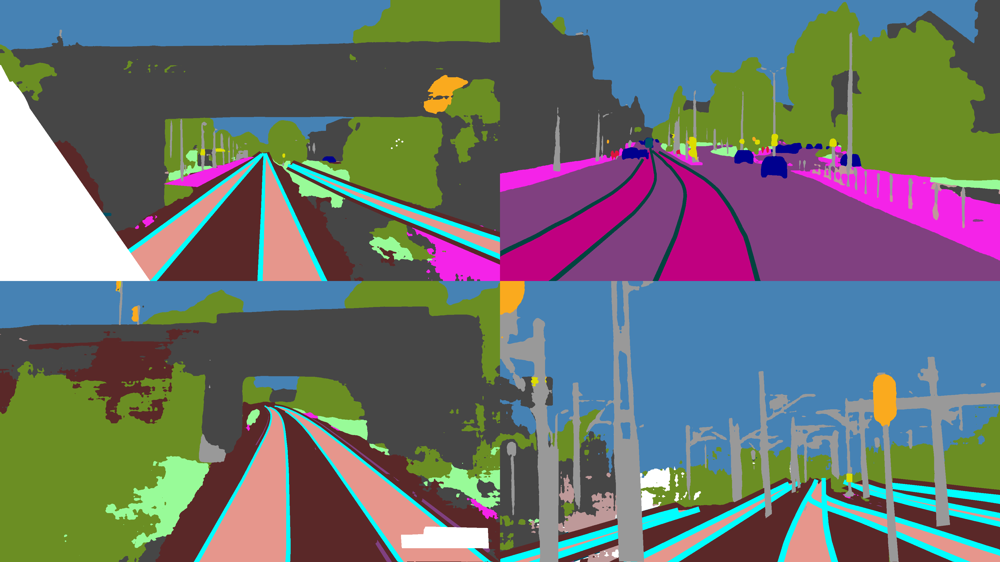

In [ ]:
images = []
for i in range(4):
    mask = np.random.choice(mask_files)
    mask = os.path.join('RailSem19/rs19_masks',mask)
    im_id_map = cv2.imread(mask,cv2.IMREAD_GRAYSCALE) #get semantic label map
    im_id_col = np.zeros((im_id_map.shape[0], im_id_map.shape[1], 3), np.uint8)
    lut_bgr = config_to_rgb()
    for c in range(3):
        im_id_col[:,:,c] = lut_bgr[c][im_id_map]
    images.append(im_id_col)
images = [np.concatenate([images[i],images[i+1]],axis=1) for i in range(0,4,2)]
Image.fromarray(np.concatenate(images,axis=0))

$$$$

### BBox Visualisation

In [ ]:
def polygon2bbox(pnts_draw):
      min_x = np.min(pnts_draw[:, 0])
      min_y = np.min(pnts_draw[:, 1])
      max_x = np.max(pnts_draw[:, 0])
      max_y = np.max(pnts_draw[:, 1])
      return min_x, min_y, max_x, max_y


def json2img(inp_path_json, line_thickness=2):
    """
      From a json file containing bbox (polygone) coordinates
      returns an image printed with these coords
    """

    inp_json = json.load(open(inp_path_json, 'r'))
    im_json = np.zeros((inp_json["imgHeight"], inp_json["imgWidth"],3), dtype=np.uint8)

    #### Sed9i
    frameid = inp_json["frame"]
    uint8_folder = 'RailSem19/rs19_masks'
    inp_path_uint8 = os.path.join(uint8_folder,frameid+".png")
    im_id_map = cv2.imread(inp_path_uint8,cv2.IMREAD_GRAYSCALE) #get semantic label map
    im_id_col = np.zeros((im_id_map.shape[0], im_id_map.shape[1], 3), np.uint8)
    lut_bgr = config_to_rgb()
    for c in range(3):
        im_id_col[:,:,c] = lut_bgr[c][im_id_map]

    im_json = np.array(Image.open(os.path.join('RailSem19/rs19_jpgs',frameid+'.jpg')).convert('RGB'))
    _ = {
        'boundingbox':[],
        'polygon':[],
    }
    ####

    restricted_classes = ['pole','fence','platform',
                          'switch-right','switch-left','crossing'] # useless classes or classes belonging to segmentations

    for obj in inp_json["objects"]:
        # skip restricted class
        if obj['label'] in restricted_classes:
              continue

        col = rs19_label2bgr.get(obj["label"],[255,255,255]) # get color for the specific object

        if "boundingbox" in obj:
            cv2.rectangle(im_json, tuple(obj["boundingbox"][0:2]), tuple(obj["boundingbox"][2:4]), col, line_thickness)
            _['boundingbox'].append(obj["label"])

        elif "polygon" in obj:
            pnts_draw = np.around(np.array(obj["polygon"])).astype(np.int32)
            min_x, min_y, max_x, max_y = polygon2bbox(pnts_draw)
            cv2.rectangle(im_json, (min_x, min_y), (max_x, max_y), col, line_thickness)
            _['polygon'].append(obj["label"])

    return im_json, inp_json["frame"],_,im_id_col

**Finds image path containing a certain class**

In [ ]:
def class2json(bbox_class):
    shuffle(all_json)
    for inp_json in tqdm(all_json[:250]):
      with open(inp_json,'r') as f:
        inp_json = json.load(f)
      for obj in inp_json['objects']:
        if bbox_class == obj['label']:
          return inp_json['frame']
json_folder='RailSem19/rs19_jsons'
all_json = files_in_subdirs(json_folder, pattern = ["*.json"])

**Plot image with bbox and respective mask**

  0%|          | 0/250 [00:00<?, ?it/s]

rs00756
{'boundingbox': ['track-signal-back', 'track-signal-back', 'track-signal-back', 'track-signal-back', 'track-signal-back'], 'polygon': ['train-car']}


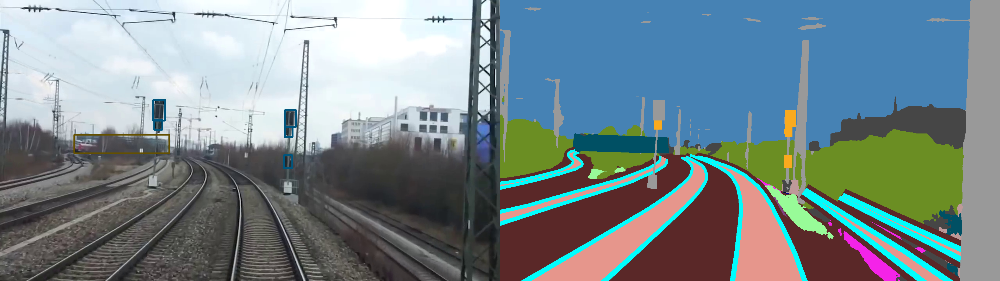

In [ ]:
bbox_class = 'train-car' #@param ['buffer-stop', 'crossing', 'guard-rail', 'train-car', 'platform', 'rail', 'switch-indicator', 'switch-left', 'switch-right', 'switch-unknown', 'switch-static', 'track-sign-front', 'track-signal-front', 'track-signal-back', 'person-group', 'car', 'fence', 'person', 'pole', 'rail-occluder', 'truck']
json_file = class2json(bbox_class)
json_file = os.path.join('RailSem19/rs19_jsons',json_file+'.json')
img_json,name,_,mask = json2img(json_file,line_thickness=5)
print(name)
print(_)
Image.fromarray(np.concatenate([img_json,mask],axis=1))

**Find all classes belonging to each bbox shape**

In [ ]:
def shape2class():
    json_folder='RailSem19/rs19_jsons'
    all_json = files_in_subdirs(json_folder, pattern = ["*.json"])
    shape_class = {
        'boundingbox':[],
        'polygon':[],
        'polyline':[],
        'polyline-pair':[]
    }
    for json_file in tqdm(all_json):
      inp_json = json.load(open(json_file, 'r'))
      for obj in inp_json['objects']:
        if 'boundingbox' in obj:
            if obj['label'] not in shape_class['boundingbox']:
              shape_class['boundingbox'].append(obj['label'])
        if 'polygon' in obj:
            if obj['label'] not in shape_class['polygon']:
              shape_class['polygon'].append(obj['label'])
        if 'polyline' in obj:
            if obj['label'] not in shape_class['polyline']:
              shape_class['polyline'].append(obj['label'])
        if 'polyline-pair' in obj:
            if obj['label'] not in shape_class['polyline-pair']:
              shape_class['polyline-pair'].append(obj['label'])
    return shape_class
shape2class()

  0%|          | 0/8500 [00:00<?, ?it/s]

{'boundingbox': ['crossing',
  'track-signal-front',
  'track-sign-front',
  'switch-right',
  'switch-unknown',
  'switch-left',
  'switch-static',
  'switch-indicator',
  'track-signal-back',
  'buffer-stop'],
 'polygon': ['pole',
  'train-car',
  'platform',
  'rail-occluder',
  'fence',
  'person',
  'person-group',
  'car',
  'truck'],
 'polyline': ['guard-rail', 'rail'],
 'polyline-pair': ['rail']}

$$$$

### Segmentation Annotations

**Visualise Individual classes**

rs07982.png


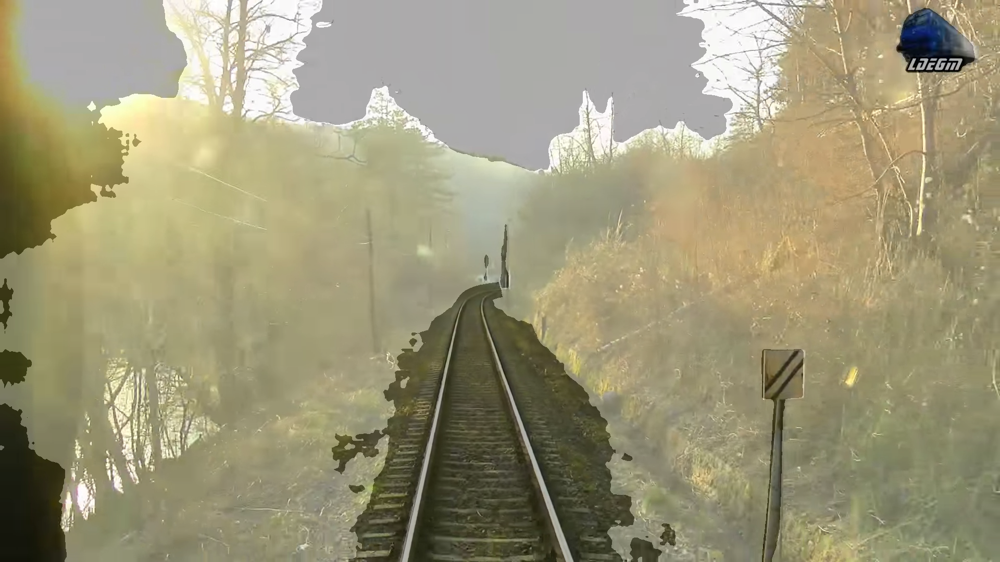

In [ ]:
shuffle(mask_files)
select_class = 'vegetation' # @param ['road', 'sidewalk', 'construction', 'tram-track', 'fence', 'pole', 'traffic-light', 'traffic-sign', 'vegetation', 'terrain', 'sky', 'human', 'rail-track', 'car', 'truck', 'trackbed', 'on-rails', 'rail-raised', 'rail-embedded']
select_class = class_2_id[select_class]


for mask in mask_files:
  path = os.path.join('RailSem19/rs19_masks',mask)
  im_id_map = cv2.imread(path,cv2.IMREAD_GRAYSCALE) #get semantic label map
  if select_class in im_id_map:
    break
print(mask)
img = os.path.join('RailSem19/rs19_jpgs',mask.replace('.png','.jpg'))

# open image & mask
img = np.array(Image.open(img).convert('RGB'))

# select the mask for the binary mask
select_classes = [select_class]
for select_class in select_classes:
  im_id_map[im_id_map == select_class] = 20 # there are 19 classes so 20 is not used
im_id_map[im_id_map != 20] = 0
im_id_map[im_id_map == 20] = 255

binary_mask = np.concatenate([im_id_map[...,np.newaxis]]*3,axis=-1)
# Color Mask
im_id_col = np.zeros((im_id_map.shape[0], im_id_map.shape[1], 3), np.uint8)
lut_bgr = config_to_rgb()
for c in range(3):
    im_id_col[:,:,c] = lut_bgr[c][im_id_map]

Image.blend(Image.fromarray(img), Image.fromarray(binary_mask), 0.3)

**Visualise Grouped Classes**

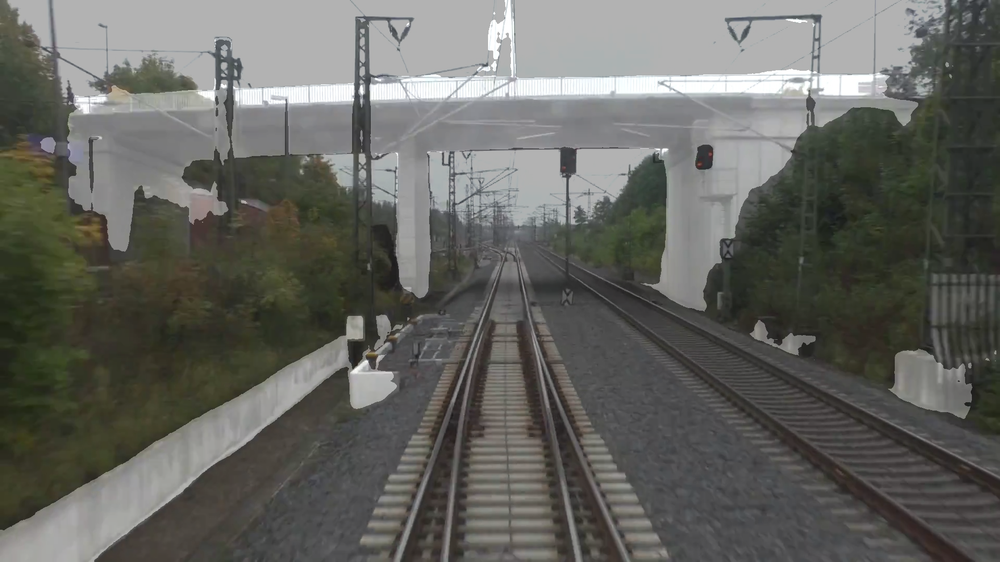

In [ ]:
shuffle(mask_files)
select_class = 'construction' # @param ['tram-track','rail-track', 'pole', 'vegetation', 'terrain', 'rail-raised', 'rail-embedded','construction']
select_class = class_2_id[select_class]


for mask in mask_files:
  path = os.path.join('RailSem19/rs19_masks',mask)
  im_id_map = cv2.imread(path,cv2.IMREAD_GRAYSCALE) #get semantic label map
  if select_class in im_id_map:
    break
class_groups = [[3,12], # track
                [17,18], # rail
                [8,9], # vegetation
                [5], # Pole
                [2] # Construction
                ]

img = os.path.join('RailSem19/rs19_jpgs',mask.replace('.png','.jpg'))
img = np.array(Image.open(img).convert('RGB'))
for select_classes in class_groups:
  if select_class in  select_classes:
    break

# select the mask for the binary mask
for select_class in select_classes:
  im_id_map[im_id_map == select_class] = 20 # there are 19 classes so 20 is not used
im_id_map[im_id_map != 20] = 0
im_id_map[im_id_map == 20] = 255

binary_mask = np.concatenate([im_id_map[...,np.newaxis]]*3,axis=-1)
# Color Mask
im_id_col = np.zeros((im_id_map.shape[0], im_id_map.shape[1], 3), np.uint8)
lut_bgr = config_to_rgb()
for c in range(3):
    im_id_col[:,:,c] = lut_bgr[c][im_id_map]

Image.blend(Image.fromarray(img), Image.fromarray(binary_mask), 0.3)

**Visualise all classes**

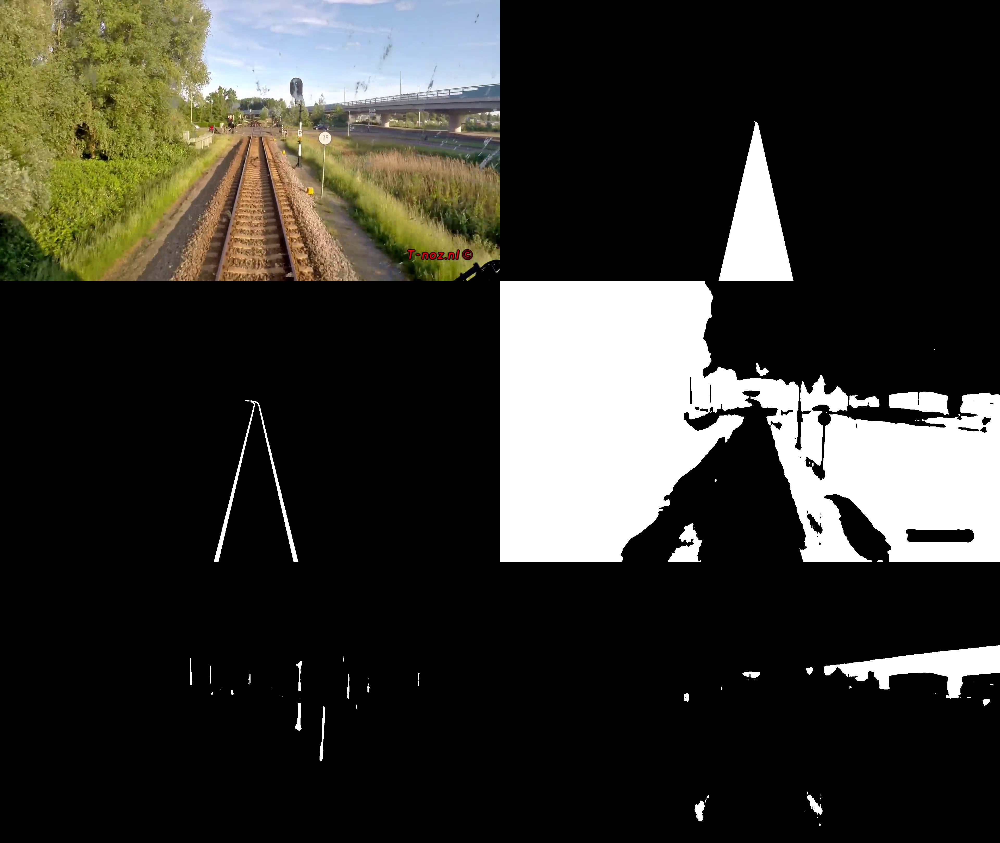

In [ ]:
mask = np.random.choice(mask_files)
path = os.path.join('RailSem19/rs19_masks',mask)
im_id_map = cv2.imread(path,cv2.IMREAD_GRAYSCALE) #get semantic label map


img = os.path.join('RailSem19/rs19_jpgs',mask.replace('.png','.jpg'))
img = np.array(Image.open(img).convert('RGB'))

class_groups = [[3,12], # track
                [17,18], # rail
                [8,9], # vegetation
                [5], # Pole
                [2] # Construction
                ]
masks = [img]
for select_classes in class_groups:
  im_id_map_copy = np.copy(im_id_map)
  for select_class in select_classes:
      im_id_map_copy[im_id_map_copy == select_class] = 20 # there are 19 classes so 20 is not used
  im_id_map_copy[im_id_map_copy != 20] = 0
  im_id_map_copy[im_id_map_copy == 20] = 255
  masks.append(np.concatenate([im_id_map_copy[...,np.newaxis]]*3,axis=-1))

masks = [np.concatenate([masks[i],masks[i+1]],axis=1) for i in range(0,6,2)]
Image.fromarray(np.concatenate(masks,axis=0))